### Ali Darabi - 810100264
### Hesam Ramezanian - 810100248
### MohammadReza Alavi - 810100253

# Data Science - Project Phase 1

In [1]:
import pandas as pd
import plotly.express as px
import plotly.graph_objs as go
from plotly.subplots import make_subplots
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import re
import warnings

In [2]:
df = pd.read_csv('Beijing.csv', encoding='gb18030')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 318851 entries, 0 to 318850
Data columns (total 26 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   url                  318851 non-null  object 
 1   id                   318851 non-null  object 
 2   Lng                  318851 non-null  float64
 3   Lat                  318851 non-null  float64
 4   Cid                  318851 non-null  int64  
 5   tradeTime            318851 non-null  object 
 6   DOM                  160874 non-null  float64
 7   followers            318851 non-null  int64  
 8   totalPrice           318851 non-null  float64
 9   price                318851 non-null  int64  
 10  square               318851 non-null  float64
 11  livingRoom           318851 non-null  object 
 12  drawingRoom          318851 non-null  object 
 13  kitchen              318851 non-null  int64  
 14  bathRoom             318851 non-null  object 
 15  floor            

C:\Users\alida\AppData\Local\Temp\ipykernel_58800\1279537971.py:1: DtypeWarning: Columns (1,11,12,14) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('Beijing.csv', encoding='gb18030')


In [3]:
df.head()

,url,id,Lng,Lat,Cid,tradeTime,DOM,followers,totalPrice,price,...,buildingType,constructionTime,renovationCondition,buildingStructure,ladderRatio,elevator,fiveYearsProperty,subway,district,communityAverage
0,https://bj.lianjia.com/chengjiao/101084782030....,101084782030,116.475489,40.019520,1111027376244,2016-08-09,1464.0,106,415.0,31680,...,1.0,2005,3,6,0.217,1.0,0.0,1.0,7,56021.0
1,https://bj.lianjia.com/chengjiao/101086012217....,101086012217,116.453917,39.881534,1111027381879,2016-07-28,903.0,126,575.0,43436,...,1.0,2004,4,6,0.667,1.0,1.0,0.0,7,71539.0
2,https://bj.lianjia.com/chengjiao/101086041636....,101086041636,116.561978,39.877145,1111040862969,2016-12-11,1271.0,48,1030.0,52021,...,4.0,2005,3,6,0.500,1.0,0.0,0.0,7,48160.0
3,https://bj.lianjia.com/chengjiao/101086406841....,101086406841,116.438010,40.076114,1111043185817,2016-09-30,965.0,138,297.5,22202,...,1.0,2008,1,6,0.273,1.0,0.0,0.0,6,51238.0
4,https://bj.lianjia.com/chengjiao/101086920653....,101086920653,116.428392,39.886229,1111027381174,2016-08-28,927.0,286,392.0,48396,...,4.0,1960,2,2,0.333,0.0,1.0,1.0,1,62588.0


# <span style="color:cyan">Preprocessing:</span>

In [4]:
df = df.drop('url', axis=1)
df = df.drop('id', axis=1)

<span style="color:pink">We drop these columns because they have no use for us.</span>

In [5]:
df.isnull().sum()

Lng                         0
Lat                         0
Cid                         0
tradeTime                   0
DOM                    157977
followers                   0
totalPrice                  0
price                       0
square                      0
livingRoom                  0
drawingRoom                 0
kitchen                     0
bathRoom                    0
floor                       0
buildingType             2021
constructionTime            0
renovationCondition         0
buildingStructure           0
ladderRatio                 0
elevator                   32
fiveYearsProperty          32
subway                     32
district                    0
communityAverage          463
dtype: int64

In [6]:
warnings.filterwarnings("ignore")
missingDf = df.isnull().sum().reset_index()
missingDf.columns = ['Variable', 'value']
missing = missingDf[missingDf['value'] > 0]
missing.loc[missing.index, 'value'] = missing['value'] / len(df)
missing = missing.sort_values(by='value', ascending=False)

fig = px.bar(missing, x='value', y='Variable', orientation='h',
             color='value', color_continuous_scale='Blackbody',
             text='value', text_auto='.2%',
             hover_data={'value': ':.2%'})

fig.update_layout(
    title={
        'text': 'Missing Value Proportion',
        'font': {'family': 'Lato', 'size': 20, 'weight': 'bold'}
    },
    xaxis_title={
        'text': 'Proportion of Missing Values',
        'font': {'family': 'Lato', 'size': 16, 'weight': 'bold'}
    },
    yaxis_title={
        'text': 'Variable',
        'font': {'family': 'Lato', 'size': 16, 'weight': 'bold'}
    },
    font=dict(family='Lato', size=16),
    template='seaborn',
    height=600,
    bargap=0.1
)

fig.update_traces(
    opacity=0.9
)

fig.show()

In [7]:
df = df.drop('DOM', axis=1)
df = df.dropna(how='any')

<span style="color:pink">As you can see, about 50 percent of the 'DOM' column is missing values, so we drop this column.</span>

<span style="color:pink">Because the number of missing values in other columns is small (under 1 percent), we drop these rows.</span>

In [8]:
print("Dataset size after dropping missing values: ", len(df))

Dataset size after dropping missing values:  316448


In [9]:
df['livingRoom'] = pd.to_numeric(df['livingRoom'], errors='coerce')
df['livingRoom'].unique()

array([2, 3, 1, 4, 5, 6, 0, 7, 8], dtype=int64)

In [10]:
df['drawingRoom'] = pd.to_numeric(df['drawingRoom'], errors='coerce')
df['drawingRoom'].unique()   

array([1, 2, 0, 4, 3, 5], dtype=int64)

In [11]:
df['bathRoom'] = pd.to_numeric(df['bathRoom'], errors='coerce')
df['bathRoom'].unique()       

array([1, 2, 3, 0, 4, 5, 6, 7], dtype=int64)

In [12]:
df['constructionTime'] = pd.to_numeric(df['constructionTime'], errors='coerce')     
df['constructionTime'].unique()

array([2005., 2004., 2008., 1960., 1997., 2009., 1991., 2001., 1990.,
       2011., 2000., 1998., 2010., 1996., 1993., 2006., 2002.,   nan,
       2012., 1989., 2003., 2007., 1994., 1984., 1992., 2014., 1985.,
       1999., 1979., 1981., 1976., 1982., 1975., 1983., 1986., 1995.,
       1965., 2013., 1988., 1987., 2015., 1955., 1980., 1978., 1958.,
       1970., 1956., 1977., 1964., 1963., 1967., 2016., 1974., 1973.,
       1959., 1954., 1962., 1966., 1957., 1972., 1971., 1953., 1968.,
       1961., 1950., 1952., 1969.])

<span style="color:pink">Because in some columns we have string values like '1' mixed with int values, we have to convert these values to numeric values.</span>

In [13]:
df['constructionTime'] = df['constructionTime'].interpolate(method='linear')
df['constructionTime'] = df['constructionTime'].round()
df['constructionTime'] = df['constructionTime'].astype(int)

<span style="color:pink">In the `constructionTime` column, we have NaN values, so we have to fill them. We use the interpolation method.</span>

In [14]:
df['tradeTime'] = pd.to_datetime(df['tradeTime'])
df['tradeTimeYear'] = df['tradeTime'].dt.year
df['tradeTimeMonth'] = df['tradeTime'].dt.month
df = df.drop('tradeTime', axis=1)
df['tradeTimeYear'].value_counts()

tradeTimeYear
2016    89984
2015    69386
2017    42710
2013    38527
2012    37046
2014    32419
2011     5974
2018      219
2010      177
2002        3
2008        1
2003        1
2009        1
Name: count, dtype: int64

<span style="color:pink">We convert `tradeTime` to Date and then add two columns `tradeTimeYear` and `tradeTimeMonth`, and then drop the original `tradeTime` column.</span>

In [15]:
df = df[df['tradeTimeYear'] > 2009]
df['tradeTimeYear'].value_counts()

tradeTimeYear
2016    89984
2015    69386
2017    42710
2013    38527
2012    37046
2014    32419
2011     5974
2018      219
2010      177
Name: count, dtype: int64

<span style="color:pink">In this part, we remove outliers from the `tradeTimeYear` column.</span>

In [16]:
unique = df["floor"].unique()
arr = [re.sub(r'\d+', '', s) for s in unique]
newArr = list(set(arr))
print("Unique chinese words: ", newArr)

Unique chinese words:  ['未知 ', '顶 ', '低 ', '中 ', '底 ', '高 ']


In [17]:
translationDict = {
    '底': 'Bottom',
    '未知': 'Unknown',
    '中': 'Middle',
    '钢混结构': 'Steel-concrete composite structure',
    '高': 'High',
    '顶': 'Top',
    '混合结构': 'Mixed structure',
    '低': 'Low'
}

def Translate(df, col):
    df[col] = df[col].replace(translationDict, regex=True)
    print(col," : ",df[col].unique())

In [18]:
translateColumns = ['drawingRoom', 'bathRoom', 'floor', 'constructionTime']
for col in translateColumns:
    Translate(df, col)

drawingRoom  :  [1 2 0 4 3 5]
bathRoom  :  [1 2 3 0 4 5 6 7]
floor  :  ['High 26' 'High 22' 'Middle 4' 'Bottom 21' 'Middle 6' 'Middle 8' 'High 6'
 'High 10' 'Middle 23' 'Bottom 11' 'High 24' 'Low 23' 'Middle 19'
 'High 18' 'Low 25' 'Middle 12' 'Middle 14' 'Middle 30' 'Middle 27'
 'Middle 5' 'Low 18' 'Bottom 28' 'Middle 11' 'Low 9' 'Top 7' 'Top 27'
 'Low 6' 'Middle 17' 'Top 6' 'Middle 24' 'Middle 15' 'Bottom 5'
 'Middle 29' 'Top 19' 'Top 5' 'Middle 9' 'Low 22' 'Top 18' 'Low 16'
 'High 13' 'High 9' 'High 17' 'Bottom 6' 'Middle 28' 'Low 26' 'Bottom 15'
 'High 16' 'Low 7' 'Middle 13' 'Low 33' 'Bottom 14' 'High 15' 'Top 11'
 'Middle 32' 'Top 16' 'Bottom 18' 'Top 17' 'Low 14' 'Low 10' 'Bottom 20'
 'High 12' 'Low 31' 'Bottom 4' 'Bottom 2' 'Low 30' 'Low 19' 'Low 12'
 'Middle 10' 'Middle 16' 'Top 20' 'Bottom 19' 'Middle 31' 'Low 13'
 'Bottom 10' 'High 25' 'Middle 21' 'Middle 20' 'High 20' 'Low 21' 'Low 24'
 'Top 4' 'High 21' 'High 7' 'Middle 22' 'Middle 7' 'Bottom 8' 'Top 15'
 'Middle 18' 'High

<span style="color:pink">We have to translate these columns because they are made up of Chinese words.</span>

In [19]:
df['buildingStructure'].unique()

array([6, 2, 4, 5, 1, 3], dtype=int64)

In [20]:
df = df[df['buildingStructure'] != 1]
df['buildingStructure'].unique()

array([6, 2, 4, 5, 3], dtype=int64)

<span style="color:pink">We drop rows with unknown values for the `buildingStructure` column because there are only 45 of them.</span>

In [21]:
print("The coordinates of the lower left corner:", min(df['Lat']), min(df['Lng']))
print("The coordinates of the upper right corner:", max(df['Lat']), max(df['Lng']))

The coordinates of the lower left corner: 39.62703 116.072514
The coordinates of the upper right corner: 40.252758 116.711337


In [22]:
def extractFloorNumber(floor):
    match = re.search(r'\d+', floor)
    return int(match.group()) if match else None

df['floorNumber'] = df['floor'].apply(extractFloorNumber)
df = df.drop('floor', axis=1)
df['floorNumber'].unique()

array([26, 22,  4, 21,  6,  8, 10, 23, 11, 24, 19, 18, 25, 12, 14, 30, 27,
        5, 28,  9,  7, 17, 15, 29, 16, 13, 33, 32, 20, 31,  2, 34,  3, 42,
       37,  1, 36, 35, 63, 57], dtype=int64)

<span style="color:pink">We create a new column called `floorNumber` from the `floor` column and then drop the original column.</span>

# <span style="color:cyan">Plots:</span>

In [23]:
def drawBeijingHousingDistribution(column, color, df):
    img = plt.imread("map1.jpg")
    fig, ax = plt.subplots(figsize=(12, 12))
    ax.imshow(img, alpha=0.5, extent=[116.07 ,116.74, 39.62, 40.26], aspect='auto')
    sns.scatterplot(data=df, x="Lng", y="Lat", alpha=0.8, hue=column, palette=color,size='price',sizes=(1,250))
    plt.legend(loc='best')
    plt.xlabel('longtitude', fontsize=18)
    plt.ylabel('latitude', fontsize=18)
    plt.title(f'Beijing housing distribution by {column}', fontsize=24)
    plt.show()

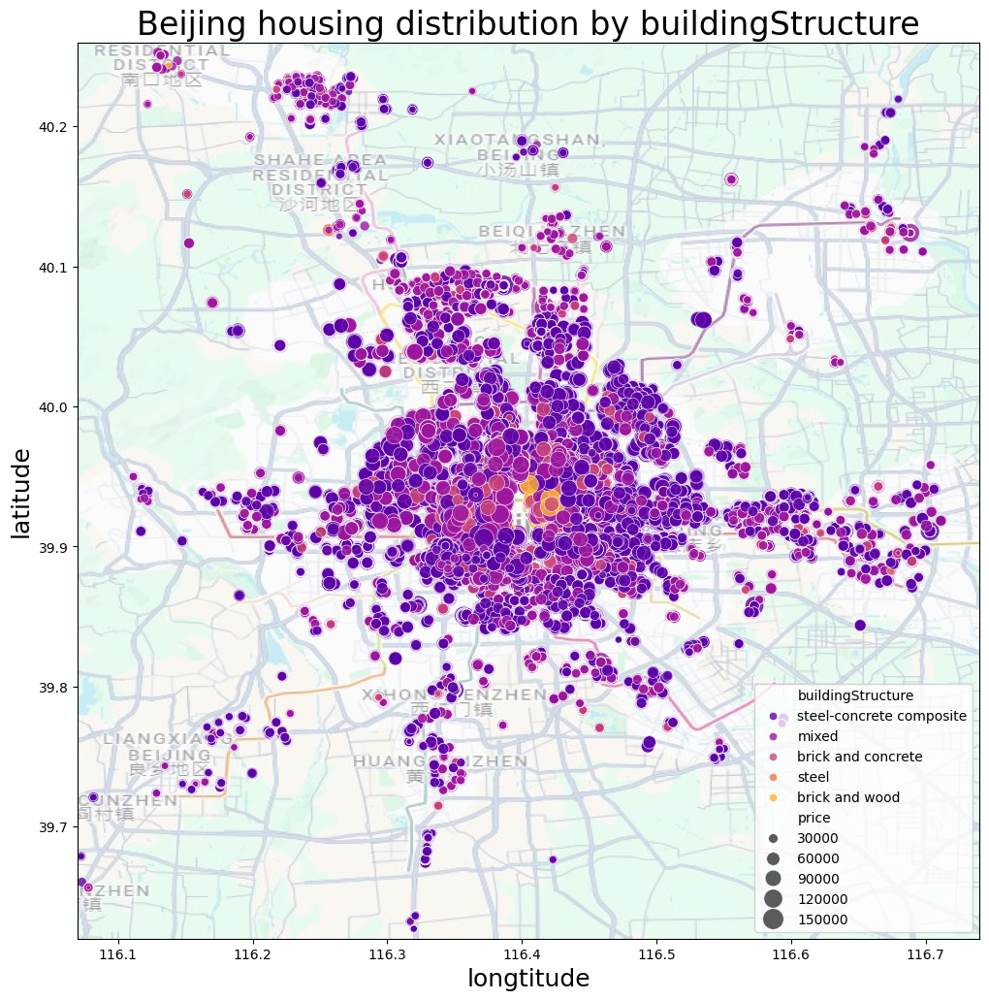

In [24]:
valueMap = {
    2: "mixed",
    3: "brick and wood",
    4: "brick and concrete",
    5: "steel",
    6: "steel-concrete composite"
}
newDf = df.copy()
newDf["buildingStructure"] = df["buildingStructure"].map(valueMap)
drawBeijingHousingDistribution("buildingStructure", "plasma", newDf)

<span style="color:pink">As you can see, most of the houses are made of steel-concrete composite and mixed, and their distribution is spread on the map.</span>

In [25]:
data = df['price']
numBins = int(np.sqrt(len(data)))
fig = px.histogram(df, x='price', nbins=numBins, title='Distribution of Housing Prices')
fig.update_layout(xaxis_title='Price', yaxis_title='Count', bargap=0.1)
fig.show()

<span style="color:pink">The histogram highlights the prevalence of lower-priced housing units in Beijing, with a concentration around the 20k-40k range and a steep drop-off in frequency as prices increase, indicating a skewed market favoring affordability over luxury housing.</span>

In [26]:
df['subway'] = df['subway'].astype(int)
df['subway'].unique()

array([1, 0])

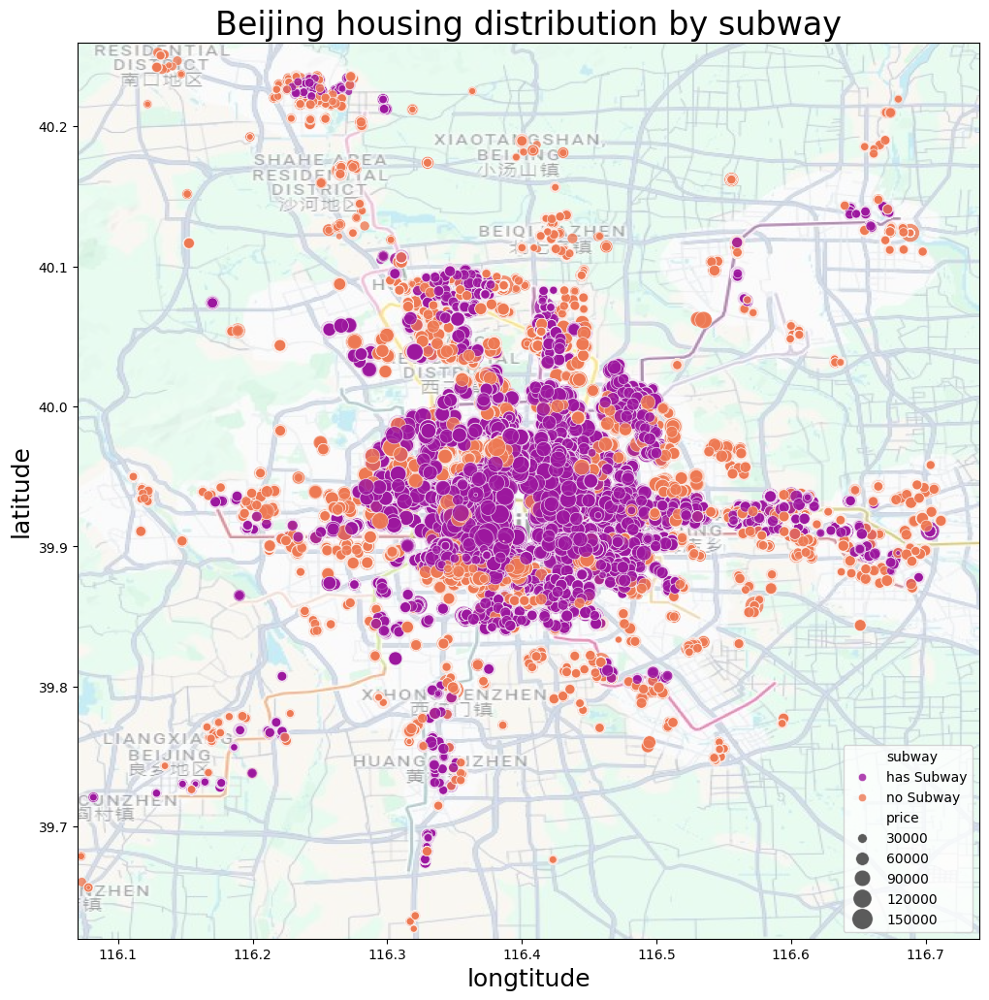

In [27]:
valueMap = {
    0: "no Subway",
    1: "has Subway",
}
newDf["subway"] = df["subway"].map(valueMap)
drawBeijingHousingDistribution("subway", "plasma", newDf)

<span style="color:pink">As you can see, most houses near the center of the city have access to the subway.</span>


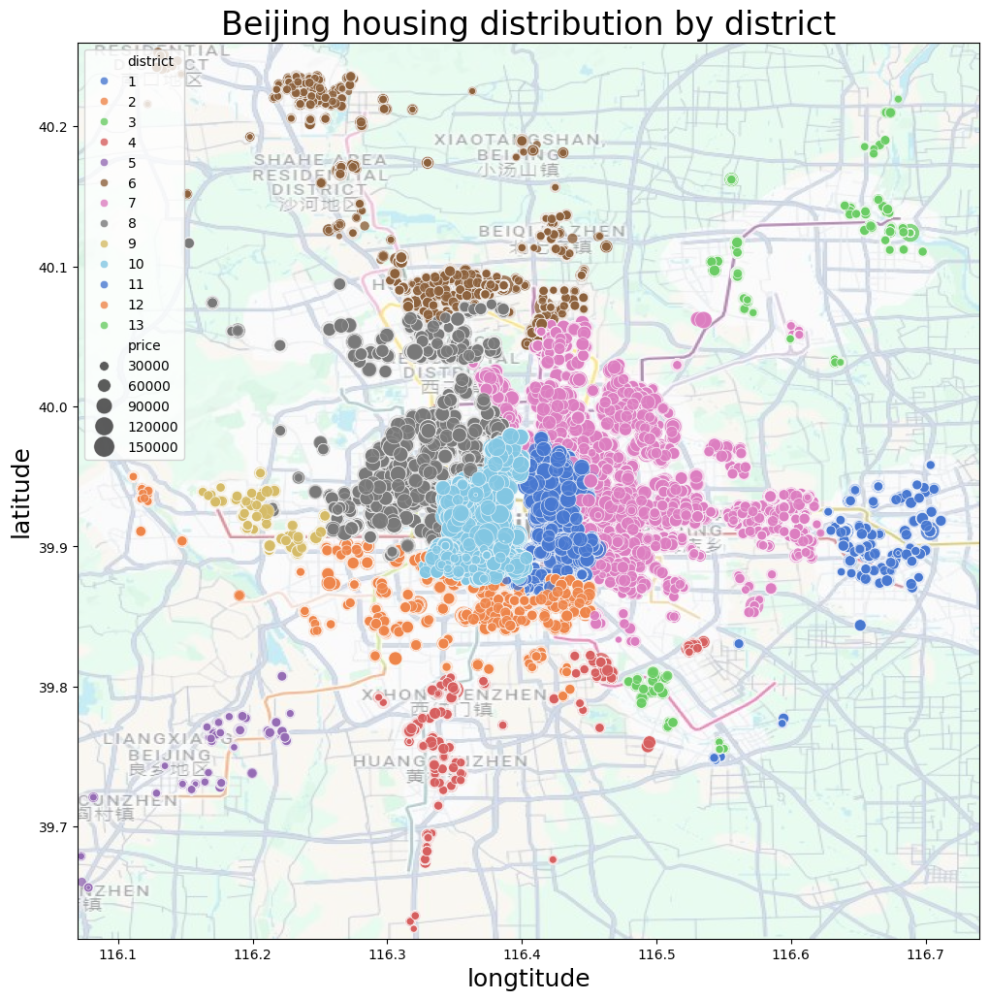

In [28]:
drawBeijingHousingDistribution("district", "muted", df)

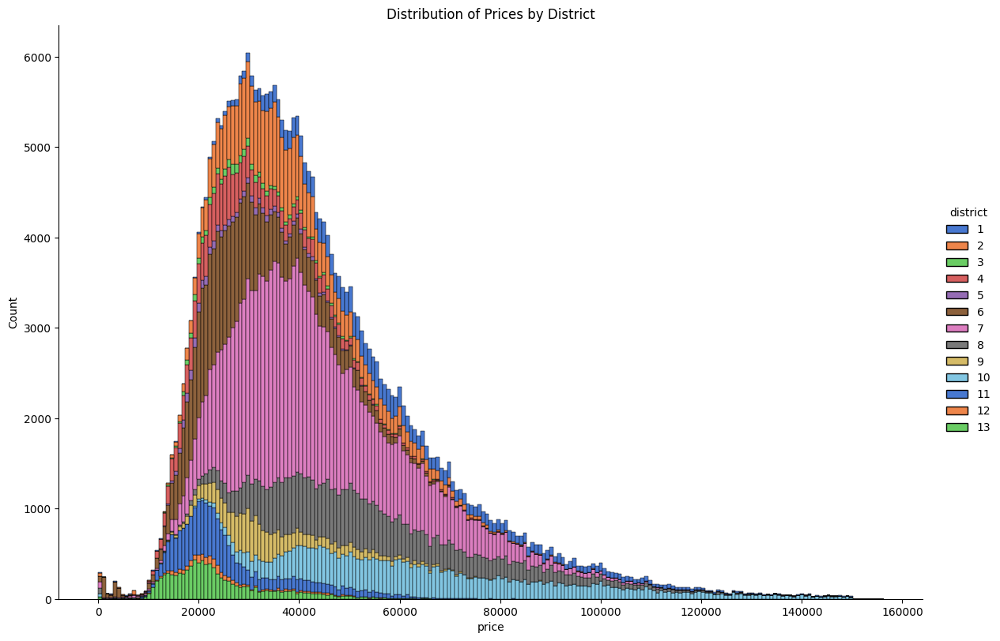

In [29]:
sns.displot(df, x='price', hue='district', palette='muted', alpha=1, multiple="stack", height=8, aspect=1.5)
plt.title("Distribution of Prices by District")
plt.show()

<span style="color:pink">As the number of the district increases, the price range decreases, and the number of houses also decreases. The reason for this could be that districts with higher numbers are usually around the city.</span>

In [30]:
dfNoElevator = df[df['elevator'] == 0]
dfWithElevator = df[df['elevator'] == 1]

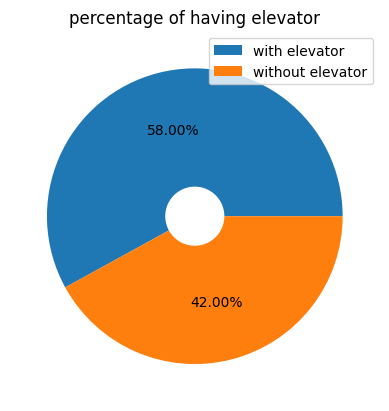

In [31]:
colors = ['#1f77b4', '#ff7f0e']
plt.pie(df['elevator'].value_counts().values, colors=colors,
           wedgeprops=dict(width=.8),autopct='%1.2f%%')
plt.title('percentage of having elevator') 
plt.legend(loc="upper right",
           labels=['with elevator', 'without elevator'])
plt.show()

fig = make_subplots(rows=1, cols=2, shared_xaxes=True, shared_yaxes=True, subplot_titles=('Distribution of Floor Numbers (Elevator = 0)', 'Distribution of Floor Numbers (Elevator = 1)'))
trace1 = go.Histogram(x=dfNoElevator['floorNumber'], nbinsx=20, histnorm='probability density', name='Elevator = 0')
trace2 = go.Histogram(x=dfWithElevator['floorNumber'], nbinsx=20, histnorm='probability density', name='Elevator = 1')
fig.add_trace(trace1, row=1, col=1)
fig.add_trace(trace2, row=1, col=2)
fig.update_layout(
    title='Floor Number Distribution',
    xaxis1_title='Floor Number',
    xaxis2_title='Floor Number',
    yaxis1_title='Frequency',
    yaxis2_title='Frequency',
    bargap=0.1,
    height=500,
    width=1000,
    xaxis1=dict(tickmode='linear', tick0=0, dtick=5),
    xaxis2=dict(tickmode='linear', tick0=0, dtick=5)
)
fig.show()

<span style="color:pink">As you can see in the plots, houses with higher `floorNumber` have elevators, and most houses with no elevator are under 10 floors.</span>

In [32]:
trace1 = go.Bar(
    x=df['tradeTimeYear'].value_counts().index,
    y=df['tradeTimeYear'].value_counts().values,
    marker=dict(color='#4CAF50'),  
    text=df['tradeTimeYear'].value_counts().values,
    textposition='auto'
)
trace2 = go.Bar(
    x=df['tradeTimeMonth'].value_counts().index,
    y=df['tradeTimeMonth'].value_counts().values,
    marker=dict(color='#2196F3'), 
    text=df['tradeTimeMonth'].value_counts().values,
    textposition='auto'
)
fig = make_subplots(rows=1, cols=2, subplot_titles=['Number of Transactions by Year', 'Number of Transactions by Month'])
fig.add_trace(trace1, row=1, col=1)
fig.add_trace(trace2, row=1, col=2)
fig.update_layout(
    title='Transactions over Time',
    height=600,
    width=1200,
    bargap=0.1,
    xaxis1_tickmode='linear', 
    xaxis1_tickvals=sorted(df['tradeTimeYear'].unique()),
    xaxis1_title='Year',
    xaxis2_title='Month',
    yaxis1_title='Number of Transactions',
    yaxis2_title='Number of Transactions'
)
fig.show()

<span style="color:pink">As you can see, in the third month, we have a higher number of transactions, and after the year 2016, the number of transactions greatly decreased.</span>

In [33]:
def plotOverAvgTotalPrice(columnName):
    AvgPrice = df.groupby(columnName)['totalPrice'].mean().reset_index()
    AvgPrice = AvgPrice.rename(columns={'totalPrice': 'AvgTotalPrice'})
    fig = px.line(AvgPrice, x=columnName, y='AvgTotalPrice', title=f'Average Price Over {columnName}')
    fig.show()

In [34]:
plotOverAvgTotalPrice('tradeTimeYear')

<span style="color:pink">As you can see on the plot, as time increases, the average price also increases.</span>

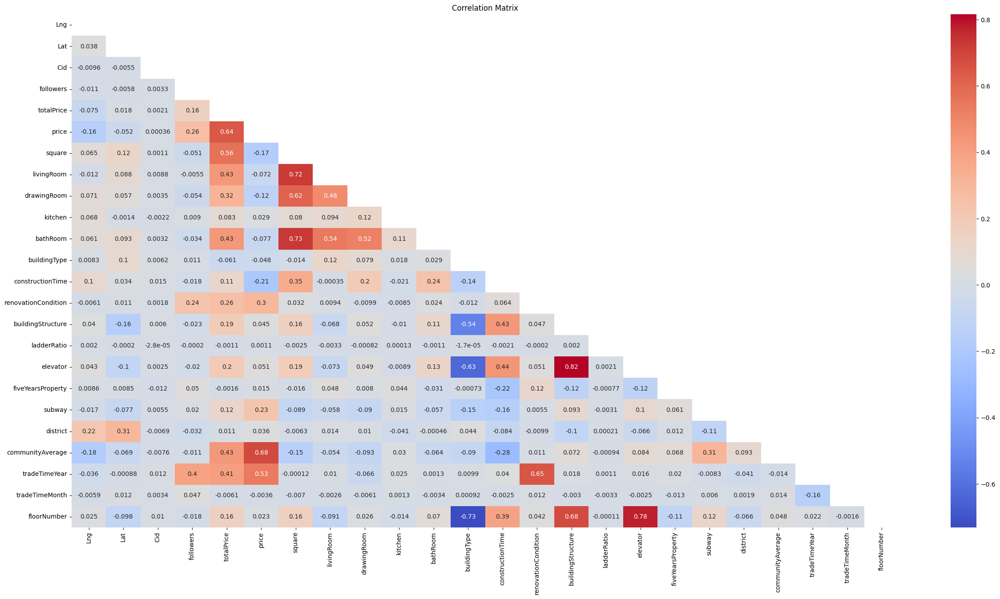

In [35]:
corrMatrix = df.corr()
plt.figure(figsize=(30, 15))
mask = np.triu(np.ones_like(corrMatrix, dtype=bool))
sns.heatmap(corrMatrix, annot=True, cmap='coolwarm', mask=mask)
plt.title('Correlation Matrix')
plt.show()

In [36]:
plotOverAvgTotalPrice('constructionTime')

In [37]:
df['constructionTime'].value_counts()

constructionTime
2004    22913
2003    20047
2005    19377
2006    16181
2000    15327
        ...  
1950       11
1969        9
1961        8
1968        5
1952        5
Name: count, Length: 66, dtype: int64

<span style="color:pink">In the Beijing housing market, properties built in a shorter timeframe tend to have higher average prices, while those with longer construction periods generally have lower average prices, with some exceptions. However, the scarcity of data points for older houses with longer construction times may affect the reliability of the average price calculations for those construction time durations.</span>

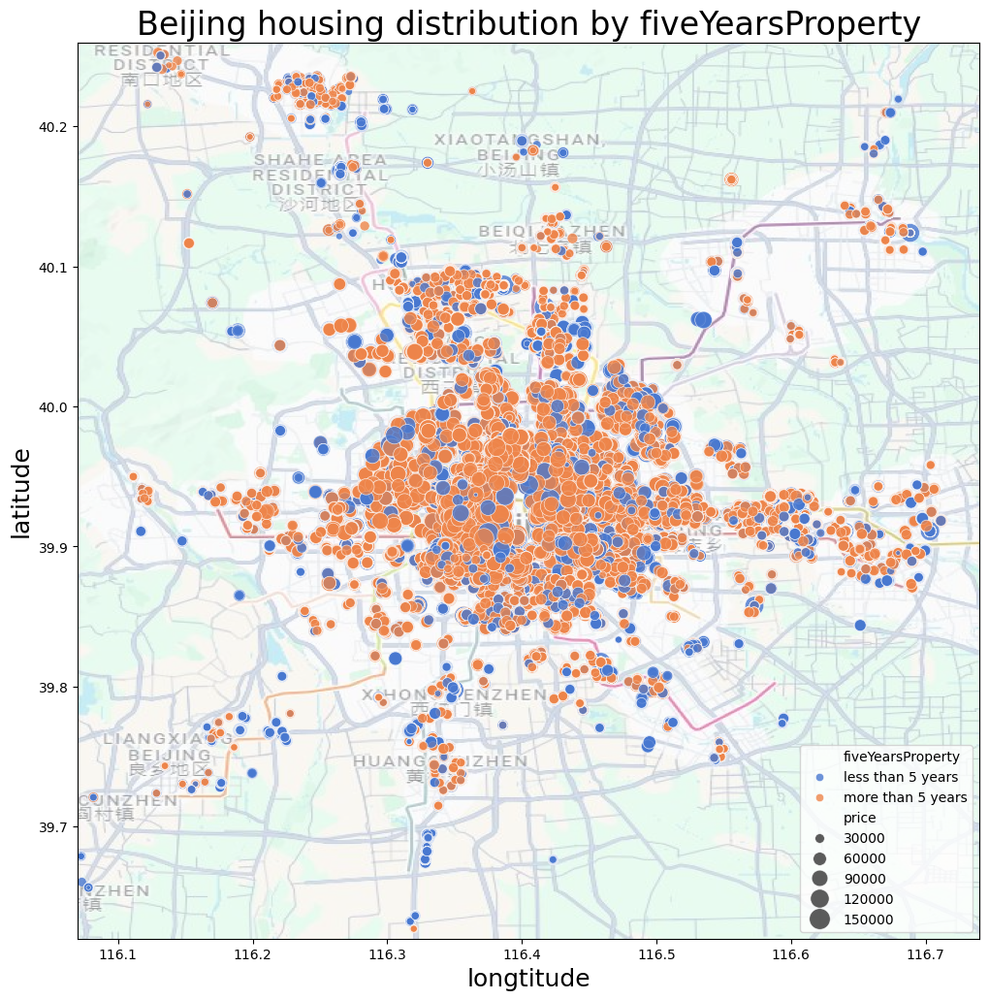

In [38]:
df['fiveYearsProperty'] = df['fiveYearsProperty'].astype(int)
valueMap = {
    0: "less than 5 years",
    1: "more than 5 years",
}
newDf["fiveYearsProperty"] = df["fiveYearsProperty"].map(valueMap)
drawBeijingHousingDistribution("fiveYearsProperty", "muted", newDf)

<span style="color:pink">As you can see, houses whose owners have had the property for less than 5 years or more than 5 years are spread all over the map, and we cannot distinguish them.</span>

In [39]:
def plotRoomsOverAvgSquare(columnName):
    avgSquare = df.groupby(columnName)['square'].mean().reset_index()
    avgSquare = avgSquare.rename(columns={'square': 'Avgsquare'})
    fig = px.line(avgSquare, x=columnName, y='Avgsquare', title=f'Average square Over {columnName}')
    fig.show()

In [40]:
plotRoomsOverAvgSquare('livingRoom')

In [41]:
plotRoomsOverAvgSquare('drawingRoom')          

In [42]:
plotRoomsOverAvgSquare('bathRoom')  

In [43]:
plotRoomsOverAvgSquare('kitchen') 

<span style="color:pink">As you can see in the plots, as the number of rooms or kitchens increases, the average square footage of houses also increases.</span>